In [87]:
import pandas as pd
data = pd.read_csv('credit_data_track2_part_A.csv',index_col=False)

In [88]:
data.columns

Index(['checking_status', 'duration', 'credit_history', 'purpose',
       'credit_amount', 'savings_status', 'employment',
       'installment_commitment', 'personal_status', 'other_parties',
       'residence_since', 'property_magnitude', 'age', 'asnm',
       'other_payment_plans', 'housing', 'existing_credits', 'job',
       'num_dependents', 'own_telephone', 'foreign_worker', 'accepted'],
      dtype='object')

In [89]:
data.head()

,checking_status,duration,credit_history,purpose,credit_amount,savings_status,employment,installment_commitment,personal_status,other_parties,...,age,asnm,other_payment_plans,housing,existing_credits,job,num_dependents,own_telephone,foreign_worker,accepted
0,<0DM,6,Critical_acct_other_credits_existing,radio/television,1169.0,Unknown_or_no_savings_acct,>7yrs,4,male_single,None,...,NaN,NaN,none,own,2,skilled_employee/official,1,yes,yes,0
1,0_to_200DM,48,Existing_credits_paid_till_now,radio/television,5951.0,<100DM,1_to_4yrs,2,female_divorced/separated/married,None,...,22.0,424.0,none,own,1,skilled_employee/official,1,none,yes,1
2,None,12,Critical_acct_other_credits_existing,education,2096.0,<100DM,4_to_7yrs,2,male_single,None,...,49.0,73.0,none,own,1,unskilled_resident,2,none,yes,0
3,<0DM,42,Existing_credits_paid_till_now,furniture/equipment,7882.0,<100DM,4_to_7yrs,2,male_single,guarantor,...,45.0,33.0,none,for_free,1,skilled_employee/official,2,none,yes,0
4,<0DM,24,Delay_in_past,new_car,4870.0,<100DM,1_to_4yrs,3,male_single,None,...,53.0,145.0,none,for_free,2,skilled_employee/official,2,none,yes,1


In [90]:
data['accepted'].value_counts()

0    703
1    300
Name: accepted, dtype: int64

In [112]:
data['own_telephone'].value_counts()

none    496
yes     257
Name: own_telephone, dtype: int64

In [94]:
#data['gender'] = data['personal_status']
data['personal_status']

1    female_divorced/separated/married
2                          male_single
3                          male_single
Name: personal_status, dtype: object

In [102]:
data['age'].mean()

35.57926221335992

In [103]:
data['age'].isnull().sum()

0

In [101]:
data['age'] = data['age'].fillna(35.58)

(array([ 27.,  88., 136., 112.,  90.,  83.,  66.,  53.,  50.,  48.]),
 array([ 250.,  624.,  998., 1372., 1746., 2120., 2494., 2868., 3242.,
        3616., 3990.]),
 <BarContainer object of 10 artists>)

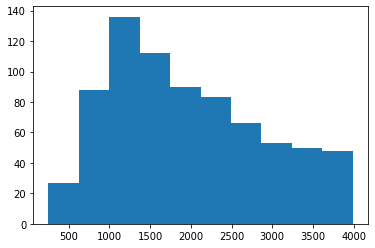

In [110]:
import matplotlib.pyplot as plt
plt.hist(data['credit_amount'])

In [111]:
data['credit_amount'].describe()

count     753.000000
mean     1960.718459
std       942.928419
min       250.000000
25%      1240.000000
50%      1820.000000
75%      2662.000000
max      3990.000000
Name: credit_amount, dtype: float64

In [108]:
data = data[data['credit_amount'] < 4000]

In [109]:
data.shape

(753, 22)

In [121]:
import pandas as pd
import random
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from statistics import mean, stdev
from math import exp

from sklearn.model_selection import train_test_split

#data = pd.read_csv('loan_data_track1.csv')
numeric_model_fields = ["age", "credit_amount"]
# X = data[numeric_model_fields]
# X.insert(len(X.columns), 'own_telephone', pd.get_dummies(data['own_telephone'])['Yes'])

data_train, data_test = train_test_split(data, test_size=0.3)

train_x = data_train[numeric_model_fields]
train_x.insert(len(train_x.columns), 'own_telephone', pd.get_dummies(data_train['own_telephone'])['yes'])
train_y = data_train['accepted']

test_x = data_test[numeric_model_fields]
test_x.insert(len(test_x.columns), 'own_telephone', pd.get_dummies(data_test['own_telephone'])['yes'])
test_y = data_test['accepted']

#train_x = data_train[numeric_model_fields]
#train_x.insert(len(train_x.columns), 'own_telephone', pd.get_dummies(data['own_telephone'])['Yes'])
#train_y = data_train['accepted']


#X_col_list = list(X.columns)
#y = data["accepted"]
# logistic_model = LogisticRegression()

#sample_size = 0.6
#result_list = []

In [122]:
model = logistic_model.fit(train_x,train_y)

In [123]:
y_val_pred = model.predict(test_x)

In [125]:
from sklearn.metrics import accuracy_score
val_score = accuracy_score(test_y, y_val_pred)
val_score

0.7300884955752213

In [127]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_y, y_val_pred)
cm

array([[165,   0],
       [ 61,   0]], dtype=int64)

In [83]:
##########################################
# Module 1: LOAD DATA
##########################################

# Load the data into R/Python and take a quick look to make sure it was loaded correctly.
import pandas as pd
data = pd.read_csv('loan_data_track1.csv',index_col=False)
#print(data)

In [84]:
data.head()

,checking_status,duration,loan_history,purpose,loan_amount,savings_status,employment,installment_commitment,personal_status,other_parties,...,property_magnitude,age,other_payment_plans,housing,existing_loans,job,num_dependents,own_telephone,foreign_worker,accepted
0,<0DM,6,Critical_acct_other_loans_existing,radio/television,1169,Unknown_or_no_savings_acct,>7yrs,4,male_single,None,...,real_estate,67,none,own,m22,skilled_employee/official,1,Yes,yes,2
1,0_to_200DM,48,Existing_loans_paid_till_now,radio/television,5951,<100DM,1_to_4yrs,2,female_divorced/separated/married,None,...,real_estate,22,none,own,e1,skilled_employee/official,1,No,yes,1
2,None,12,Critical_acct_other_loans_existing,education,2096,<100DM,4_to_7yrs,2,male_single,None,...,real_estate,49,none,own,1,unskilled_resident,2,No,yes,2
3,<0DM,42,Existing_loans_paid_till_now,furniture/equipment,7882,<100DM,4_to_7yrs,2,male_single,guarantor,...,building_society_savings_agreement/life_insurance,45,none,for_free,q1,skilled_employee/official,2,No,yes,2
4,<0DM,24,Delay_in_past,new_car,4870,<100DM,1_to_4yrs,3,male_single,None,...,unknown/no_property,53,none,for_free,p22,skilled_employee/official,2,No,yes,1


In [35]:
data.describe()

,duration,loan_amount,installment_commitment,residence_since,age,num_dependents,accepted
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,20.903000,3271.258000,2.973000,2.845000,35.546000,1.155000,1.700000
std,12.058814,2822.736876,1.118715,1.103718,11.375469,0.362086,0.458487
min,4.000000,250.000000,1.000000,1.000000,19.000000,1.000000,1.000000
25%,12.000000,1365.500000,2.000000,2.000000,27.000000,1.000000,1.000000
50%,18.000000,2319.500000,3.000000,3.000000,33.000000,1.000000,2.000000
75%,24.000000,3972.250000,4.000000,4.000000,42.000000,1.000000,2.000000
max,72.000000,18424.000000,4.000000,4.000000,75.000000,2.000000,2.000000


In [36]:
data.shape

(1000, 21)

In [39]:
data.columns

Index(['checking_status', 'duration', 'loan_history', 'purpose', 'loan_amount',
       'savings_status', 'employment', 'installment_commitment',
       'personal_status', 'other_parties', 'residence_since',
       'property_magnitude', 'age', 'other_payment_plans', 'housing',
       'existing_loans', 'job', 'num_dependents', 'own_telephone',
       'foreign_worker', 'accepted'],
      dtype='object')

In [40]:
data['accepted'].describe()

count    1000.000000
mean        0.700000
std         0.458487
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: accepted, dtype: float64

In [38]:
##########################################
# Module 2: DATA EXPLORATION
##########################################

# Whether an application was accepted is coded in a column named "accepted" which has only two levels: 1=rejected and 2=accepted.  
# We would like to alter this variable in place so that 0=rejected and 1=accepted.  

#print(data['accepted'].head())# look at first few values
data['accepted'] = data['accepted'] -1
data['accepted'].head()# look at first few values

0    1
1    0
2    1
3    1
4    0
Name: accepted, dtype: int64

In [42]:
# What percentage of the loan applications were accepted?
# 700/1000 = 70%
percentage = float(data['accepted'].sum())/float(data['accepted'].count())
percentage

0.7

In [43]:
# What is the most common purpose for the loan applications?
# radio/television 280
data['purpose'].value_counts()

radio/television       280
new_car                234
furniture/equipment    181
used_car               103
business                97
education               50
repairs                 22
domestic_appliances     12
other                   12
retraining               9
Name: purpose, dtype: int64

In [44]:
# What is the average age of loan applicants that were accepted compared to the average age of applicants that were rejected?
data.groupby('accepted')['age'].mean()

accepted
0    33.963333
1    36.224286
Name: age, dtype: float64

In [45]:
##########################################
# Module 3: DATA WRANGLING
##########################################

# The "existing_loans" field appears to have an issue with some preceding junk characters we need to clean up.  
# In each entry of the field there are 0 to 3 lowercase alphabet characters which precede the true numeric value for the number of existing loans.  
# Please remove these preceding characters

data['existing_loans'].head() # Look at the first few values

0    m22
1     e1
2      1
3     q1
4    p22
Name: existing_loans, dtype: object

In [47]:
# via string methods regular expression replacement
data['existing_loans'] = data['existing_loans'].str.replace('^[a-z]{0,3}','')
data['existing_loans'].head() 

C:\Users\ksudo\AppData\Local\Temp\ipykernel_27256\3068460014.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  data['existing_loans'] = data['existing_loans'].str.replace('^[a-z]{0,3}','')


0    22
1     1
2     1
3     1
4    22
Name: existing_loans, dtype: object

In [49]:
##########################################
# Module 4: PREDICTIVE MODELING
##########################################

# Next we want to build a model to predict the outcome of each loan application.  
# However, for legal reasons we are only allowed to use the following 5 features: age, checking_status, duration, job, and purpose.
# Please build a model to predict the outcome of each loan application.
# Feel free to use the modeling technique of your choice. 

from sklearn.linear_model import LinearRegression
from sklearn import preprocessing
model = LinearRegression()
le_CS = preprocessing.LabelEncoder()
data['CS_encoded'] = le_CS.fit_transform(data['checking_status'])
cols = ['age','CS_encoded','installment_commitment','duration','loan_amount']
myX = data[cols]
myY = data['accepted']
model.fit(myX,myY)

0      1
1      0
2      3
3      1
4      1
      ..
995    3
996    1
997    3
998    1
999    0
Name: CS_encoded, Length: 1000, dtype: int32

In [61]:
model.predict(data[cols]).round(0).shape

(1000,)

In [50]:
# Now we want to use the model you just built to make predictions for the entire dataset.
# If your model creates continuous predictions please convert those to binary 0/1 predictions.  
# What percent of loan applications did your model predict correctly?
pd.crosstab(model.predict(data[cols]).round(0),data['accepted'])

accepted,0,1
row_0,,
0.0,75,54
1.0,225,646


In [62]:
# What are some other quantitative measures to gauge how accurate those predictions are?
import sklearn.metrics as mx # via sklearn metrics package
# recall/sensitivity = true positive rate = fraction of positive instances that are correctly identified as such
mx.recall_score(data['accepted'],model.predict(data[cols]).round(0))

0.9228571428571428

In [63]:
# precision/specificity = true negative rate = fraction of negative instances that are correctly identified as such
mx.precision_score(data['accepted'],model.predict(data[cols]).round(0))
# What are some ways that the existing model that you built could be improved
# Variety of options depending on model choice. Observe & ensure candidate chooses & acts upon a model improvement strategy

0.7416762342135477

In [64]:
mx.f1_score(data['accepted'],model.predict(data[cols]).round(0))

0.8224061107574793

In [71]:
##########################################
# Module 5: HYPOTHESIS TESTING
##########################################

# Please take a second to look through this code..
# explain what the code is doing..
# what type of question would this piece of code help to answer?

import pandas as pd
import random
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from statistics import mean, stdev
from math import exp

data = pd.read_csv('loan_data_track1.csv')
numeric_model_fields = ["age", "duration", "loan_amount", "installment_commitment"]
X = data[numeric_model_fields]
X.insert(len(X.columns), 'own_telephone_Yes', pd.get_dummies(data['own_telephone'])['Yes'])

X_col_list = list(X.columns)
y = data["accepted"]
logistic_model = LogisticRegression()
sample_size = 0.6
result_list = []

['age',
 'duration',
 'loan_amount',
 'installment_commitment',
 'own_telephone_Yes']

C:\Users\ksudo\AppData\Roaming\Python\Python310\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\ksudo\AppData\Roaming\Python\Python310\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mo

1.5042504694206809
0.3534295880907703


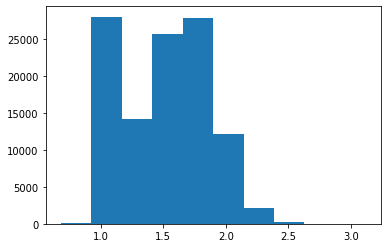

In [82]:
for i in range(100000):
    sample_index = random.sample(range(len(data)),int(len(data) * sample_size))
    model = logistic_model.fit(X.loc[sample_index], y.loc[sample_index])
    result_list.append(exp(model.coef_[0][X_col_list.index('own_telephone_Yes')]))

print(mean(result_list))
print(stdev(result_list))
plt.hist(result_list)
plt.show()